In [1]:
import pandas as pd
from scipy.io import arff
from sklearn.linear_model import LogisticRegression, Lasso
from sklearn.model_selection import cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.multiclass import OneVsRestClassifier
from sklearn import metrics
import numpy as np
import plotly.graph_objects as go
from skater.core.explanations import Interpretation
from skater.model import InMemoryModel
import matplotlib.pyplot as plt
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.metrics import roc_curve, auc

In [2]:
train = arff.loadarff('/Users/shenchingfeng/Documents/1112/機器學習/Homework 3/wave_2_classes_with_irrelevant_attributes/wave_2_classes_with_irrelevant_attributes.train.arff')
test = arff.loadarff('/Users/shenchingfeng/Documents/1112/機器學習/Homework 3/wave_2_classes_with_irrelevant_attributes/wave_2_classes_with_irrelevant_attributes.test.arff')

In [3]:
train = pd.DataFrame(train[0])
train

,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,...,alea92,alea93,alea94,alea95,alea96,alea97,alea98,alea99,alea100,classe
0,-0.38,-0.72,1.30,3.04,2.10,3.63,4.59,3.55,0.76,4.58,...,0.79,0.20,0.22,0.21,0.42,0.76,0.95,0.86,0.07,b'A'
1,-0.33,0.04,0.83,0.70,3.26,1.73,3.48,3.52,1.45,1.91,...,0.20,0.86,0.83,0.95,0.48,0.96,0.20,0.73,0.71,b'A'
2,0.48,0.94,2.49,2.82,2.93,5.55,3.48,5.65,5.01,3.90,...,0.42,0.77,0.94,0.51,0.15,0.89,0.62,0.31,0.21,b'A'
3,0.57,1.15,1.71,2.45,0.60,2.32,2.29,1.74,1.84,3.16,...,0.00,0.51,0.29,0.38,0.07,0.83,0.18,0.82,0.76,b'A'
4,-1.99,-1.87,1.03,2.07,3.42,3.71,6.98,3.87,1.16,2.85,...,0.02,0.48,0.15,0.05,0.26,0.72,0.03,0.18,0.84,b'A'
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.18,0.96,1.72,3.58,2.10,2.40,3.24,3.68,5.33,4.92,...,0.11,0.52,0.98,0.65,0.82,0.83,0.69,0.47,0.25,b'B'
9996,-0.07,1.59,0.87,-0.42,0.58,1.26,5.07,4.65,4.10,3.64,...,0.77,0.29,0.64,0.34,0.86,0.72,0.88,0.48,0.54,b'B'
9997,2.04,-0.79,2.46,1.08,2.84,4.37,6.50,5.47,3.67,2.29,...,0.28,0.82,0.13,0.75,0.71,0.82,0.63,0.76,0.88,b'B'
9998,0.59,1.54,0.81,1.09,2.37,4.87,5.27,4.81,6.03,4.29,...,0.55,0.24,0.53,0.84,0.32,0.05,0.03,0.42,0.32,b'B'


In [4]:
test = pd.DataFrame(test[0])
test

,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,...,alea92,alea93,alea94,alea95,alea96,alea97,alea98,alea99,alea100,classe
0,-1.14,1.21,0.42,0.83,1.08,1.42,-0.09,0.91,0.02,2.32,...,0.63,0.15,0.68,0.23,0.28,0.19,0.17,0.33,0.43,b'A'
1,0.82,0.75,-0.44,1.27,-0.69,0.93,2.69,-0.82,-2.23,-0.15,...,0.07,0.72,0.26,0.56,0.93,0.09,0.84,0.38,0.49,b'A'
2,0.08,0.96,-0.65,2.08,2.89,1.28,2.97,2.78,0.86,0.37,...,0.19,0.83,0.23,0.48,0.72,0.01,0.76,0.00,0.37,b'A'
3,-0.20,3.04,2.76,3.08,4.06,1.46,4.32,3.94,2.38,2.71,...,0.63,0.80,0.31,0.42,0.18,0.07,0.68,0.43,0.37,b'A'
4,-1.45,-0.22,1.05,-0.21,0.23,-1.56,1.22,-0.01,-0.15,1.64,...,0.88,0.24,0.77,0.27,0.85,0.08,0.07,0.17,0.93,b'A'
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23329,-0.47,0.84,1.34,3.26,4.20,5.19,3.83,5.37,4.05,2.13,...,0.83,0.78,0.29,0.95,0.34,0.51,0.89,0.79,0.96,b'B'
23330,1.29,0.19,0.84,-0.43,-0.26,1.25,2.13,4.64,3.23,5.28,...,0.75,0.91,0.45,0.77,0.92,0.58,0.25,0.96,0.56,b'B'
23331,0.64,-0.31,0.64,1.00,0.09,1.93,3.16,3.17,3.52,3.45,...,0.28,0.22,0.72,0.22,0.70,0.69,0.02,0.63,0.05,b'B'
23332,-0.01,-0.16,-0.88,-0.10,0.79,1.35,2.03,1.44,3.79,4.40,...,0.90,0.76,0.68,0.80,0.93,0.90,0.28,0.23,0.16,b'B'


In [162]:
x = np.linspace(-10, 10, 1000)

sigma_values = [0.5, 1, 2]

fig = go.Figure()

for sigma in sigma_values:
    pdf = np.exp(-np.square(x) / (2 * np.square(sigma))) / (np.sqrt(2 * np.pi) * sigma)
    
    fig.add_trace(
        go.Scatter(
            x = x, y = pdf, 
            mode = 'lines', 
            name = f'b={sigma}'
        )
    )

fig.update_layout(
    title = {
        'text': 'Gaussian Distribution',
        'font': {'size': 32, 'family': 'Gulliver'},
        'x': 0.45, 'y': 0.95
    }, width = 1200, height = 800
)

fig.update_xaxes(
    title = {
        'text': 'beta',
        'font': {'size': 24, 'family': 'Gulliver'}
    }, tickfont = {'size': 16}
)

fig.update_yaxes(
    title = {
        'text': 'Probability Density',
        'font': {'size': 24, 'family': 'Gulliver'}
    }, tickfont = {'size': 16}
)
fig.show()

In [164]:
x = np.linspace(-10, 10, 1000)

b_values = [0.5, 1, 2]

fig = go.Figure()

for b in b_values:
    pdf = np.exp(-np.abs(x) / b) / (2 * b)
    
    fig.add_trace(
        go.Scatter(
            x = x, y = pdf, 
            mode = 'lines', 
            name = f'b={b}'
        )
    )

fig.update_layout(
    title = {
        'text': 'Laplacian Distribution',
        'font': {'size': 32, 'family': 'Gulliver'},
        'x': 0.5, 'y': 0.95
    }, width = 1200, height = 800
)

fig.update_xaxes(
    title = {
        'text': 'beta',
        'font': {'size': 24, 'family': 'Gulliver'}
    }, tickfont = {'size': 16}
)

fig.update_yaxes(
    title = {
        'text': 'Probability Density',
        'font': {'size': 24, 'family': 'Gulliver'}
    }, tickfont = {'size': 16}
)
fig.show()


In [5]:
dummy_variables_train = pd.get_dummies(train['classe'], prefix = 'classe')
dummy_variables_test = pd.get_dummies(test['classe'], prefix = 'classe')

train = pd.concat([train, dummy_variables_train], axis = 1)
test = pd.concat([test, dummy_variables_test], axis = 1)

train.drop(["classe_b'A'", "classe"], axis = 1, inplace = True)
test.drop(["classe_b'A'", "classe"], axis = 1, inplace = True)

train.rename(columns = {"classe_b'B'":"cls"}, inplace = True)
test.rename(columns = {"classe_b'B'":"cls"}, inplace = True)

In [6]:
## 分層抽樣
kf = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 42)

## Lasso Feature Selection

In [293]:
X = train.drop(['cls'], axis = 1)
y = train.cls

scl = StandardScaler()
X_scl = scl.fit_transform(X)

lasso = Lasso()
params = {
    'alpha': [10**i for i in range(-2, 1)],
    'selection': ['cyclic', 'random']
}
gridlasso = GridSearchCV(lasso, param_grid = params, cv = kf, n_jobs = -1)
gridlasso.fit(X_scl, y)

print("Best alpha:", gridlasso.best_params_)
print("Best scores:", gridlasso.best_score_)

coefficients = gridlasso.best_estimator_.coef_
importance = np.abs(coefficients)
print(np.array(X.columns)[importance > 0])

Best alpha: {'alpha': 0.01, 'selection': 'cyclic'}
Best scores: 0.6591250927457267
['v4' 'v5' 'v8' 'v9' 'v10' 'v11' 'v12' 'v13' 'v15' 'v16' 'v17' 'v18' 'v19'
 'v20']


In [211]:
column_names = X.columns
penalty_values = np.logspace(-4, 0, 1000)

coefficients = []

for penalty in penalty_values:
    lasso = Lasso(alpha = penalty)
    lasso.fit(X_scl, y)
    coefficients.append(lasso.coef_)

fig = go.Figure()

for feature in range(X.shape[1]):
    fig.add_trace(
        go.Scatter(
            x = np.log10(penalty_values),
            y = [coef[feature] for coef in coefficients],
            mode = 'lines',
            name = f'{column_names[feature]}'
        )
    )

fig.update_layout(
    title = {
        'text':'Lasso Penalty vs. Coefficients (all)',
        'font': {'size': 32, 'family': 'Gulliver'},
        'x': 0.5, 'y': 0.95
        }, height = 800, width = 1200
)

fig.update_xaxes(
    title = {
        'text':"Penalty (Log(lambda))", 
        'font': {'size': 24, 'family': 'Gulliver'}
        }, tickfont = {'size': 16}
)

fig.update_yaxes(
    title = {
        'text':"Coefficient Value", 
        'font': {'size': 24, 'family': 'Gulliver'}
        }, tickfont = {'size': 16}
)

fig.show()

In [295]:
X = train[['v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v9', 'v10', 'v11', 'v12', 'v13', 'v14', 'v15', 'v16', 'v17', 'v18', 'v19','v20','v21']]
y = train.cls

scl = StandardScaler()
X_scl = scl.fit_transform(X)

lasso = Lasso()
params = {
    'alpha': [10**i for i in range(-3, 2)],
    'selection': ['cyclic', 'random']
}
gridlasso = GridSearchCV(lasso, param_grid = params, cv = kf, n_jobs = -1)
gridlasso.fit(X_scl, y)

print("Best alpha:", gridlasso.best_params_)
print("Best scores:", gridlasso.best_score_)

coefficients = gridlasso.best_estimator_.coef_
importance = np.abs(coefficients)
print(np.array(X.columns)[importance > 0])

Best alpha: {'alpha': 0.001, 'selection': 'random'}
Best scores: 0.6624269648828596
['v2' 'v3' 'v4' 'v5' 'v6' 'v8' 'v9' 'v10' 'v11' 'v12' 'v13' 'v14' 'v15'
 'v16' 'v17' 'v18' 'v19' 'v20' 'v21']


In [296]:
column_names = X.columns
penalty_values = np.logspace(-4, 0, 1000)

coefficients = []

for penalty in penalty_values:
    lasso = Lasso(alpha = penalty)
    lasso.fit(X_scl, y)
    coefficients.append(lasso.coef_)

fig = go.Figure()

for feature in range(X.shape[1]):
    fig.add_trace(
        go.Scatter(
            x = np.log10(penalty_values),
            y = [coef[feature] for coef in coefficients],
            mode = 'lines',
            name = f'{column_names[feature]}'
        )
    )

fig.update_layout(
    title = {
        'text':'Lasso Penalty vs. Coefficients (v)',
        'font': {'size': 32, 'family': 'Gulliver'},
        'x': 0.5, 'y': 0.95
        }, height = 800, width = 1200
)

fig.update_xaxes(
    title = {
        'text':"Penalty (Log(lambda))", 
        'font': {'size': 24, 'family': 'Gulliver'}
        }, tickfont = {'size': 16}
)

fig.update_yaxes(
    title = {
        'text':"Coefficient Value", 
        'font': {'size': 24, 'family': 'Gulliver'}
        }, range = [-0.09, 0.13], tickfont = {'size': 16}
)

fig.show()

In [281]:
X = train.drop(['v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v9', 'v10', 'v11', 'v12', 'v13', 'v14', 'v15', 'v16', 'v17', 'v18', 'v19','v20','v21', 'cls'], axis = 1)
y = train.cls

scl = StandardScaler()
X_scl = scl.fit_transform(X)

lasso = Lasso()
params = {
    'alpha': [10**i for i in range(-5, 5)],
    'selection': ['cyclic', 'random']
}
gridlasso = GridSearchCV(lasso, param_grid = params, cv = kf, n_jobs = -1)
gridlasso.fit(X_scl, y)

print("Best alpha:", gridlasso.best_params_)
print("Best scores:", gridlasso.best_score_)

coefficients = gridlasso.best_estimator_.coef_
importance = np.abs(coefficients)
print(np.array(X.columns)[importance > 0])

Best alpha: {'alpha': 0.1, 'selection': 'cyclic'}
Best scores: -2.500008501993278e-07
[]


In [286]:
column_names = X.columns
penalty_values = np.logspace(-4, 0, 1000)

coefficients = []

for penalty in penalty_values:
    lasso = Lasso(alpha = penalty)
    lasso.fit(X_scl, y)
    coefficients.append(lasso.coef_)

fig = go.Figure()

for feature in range(X.shape[1]):
    fig.add_trace(
        go.Scatter(
            x = np.log10(penalty_values),
            y = [coef[feature] for coef in coefficients],
            mode = 'lines',
            name = f'{column_names[feature]}'
        )
    )

fig.update_layout(
    title = {
        'text':'Lasso Penalty vs. Coefficients (a)',
        'font': {'size': 32, 'family': 'Gulliver'},
        'x': 0.5, 'y': 0.95
        }, height = 800, width = 1200
)

fig.update_xaxes(
    title = {
        'text':"Penalty (Log(lambda))", 
        'font': {'size': 24, 'family': 'Gulliver'}
        }, tickfont = {'size': 16}
)

fig.update_yaxes(
    title = {
        'text':"Coefficient Value", 
        'font': {'size': 24, 'family': 'Gulliver'}
        }, range = [-0.09, 0.13], tickfont = {'size': 16}
)

fig.show()

## Cross Validation

In [21]:
model = LogisticRegression(max_iter = int(1e7))

X = train[['v4', 'v5', 'v8', 'v9', 'v10', 'v11', 'v12', 'v13', 'v15', 'v16', 'v17', 'v18', 'v19', 'v20']]
y = train.cls

scl = StandardScaler()
X_scl = scl.fit_transform(X)

params = {
    'C': [10**i for i in range(-4, 5)],
    'penalty': ['l2', 'elasticnet', 'None'],
    'solver': ['lbfgs', 'liblinear', 'saga']   
}

grid_search = GridSearchCV(model, param_grid = params, cv = kf)
grid_search.fit(X_scl, y)

print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

Best parameters: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
Best score: 0.9193000000000001


/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning:


270 fits failed out of a total of 405.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
45 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
Va

## Logistic Regression

### Without Selection model performance

In [235]:
x_train = train.drop(['cls'], axis = 1)
y_train = train.cls

x_test = test.drop(['cls'], axis = 1)
y_test = test.cls

scl = StandardScaler()
x_train = scl.fit_transform(x_train)
x_test = scl.transform(x_test)

clf = LogisticRegression(max_iter = int(1e7), random_state = 42)
model = clf.fit(x_train, y_train)
y_pred = model.predict(x_test)

In [236]:
acu = metrics.accuracy_score(y_test, y_pred)
pre_class, r_class, f_class, sup = metrics.precision_recall_fscore_support(y_test, y_pred, average = 'weighted')

print("Acurracy: ", round(acu * 100, 4), '%')
print('Precision:', round(pre_class * 100, 4), '%')
print('Recall:', round(r_class * 100, 4), '%')
print('f1:', round(f_class * 100, 4), '%')

cm = metrics.confusion_matrix(y_test, y_pred)
cm = pd.DataFrame(cm)
cm
# cm_norm = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis] 
# cm_norm = pd.DataFrame(cm_norm)
# cm_norm

Acurracy:  92.1359 %
Precision: 92.1531 %
Recall: 92.1359 %
f1: 92.1358 %


,0,1
0,10729,1031
1,804,10770


[121/121] features ████████████████████ Time elapsed: 31 seconds

Text(0.5, 1.0, 'Feature Importance of Logistic Regression')

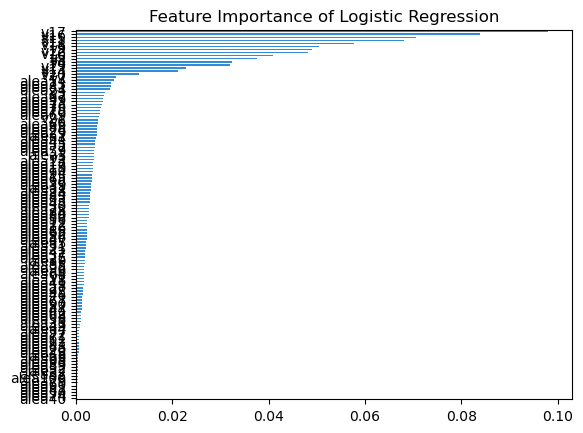

In [36]:
interpreter = Interpretation(
    x_test, feature_names = X.columns
)

pyint_model = InMemoryModel(
    model.predict_proba,
    examples = x_train
)

plots= interpreter.feature_importance.plot_feature_importance(pyint_model, ascending = False, progressbar = True)
plt.title('Feature Importance of Logistic Regression')

In [237]:
fpr, tpr, _ = roc_curve(
    y_test, 
    model.predict_proba(x_test)[:, 1]
)

roc_auc = auc(fpr, tpr)

trace1 = go.Scatter(
    x = fpr, y = tpr, 
    mode = 'lines', 
    line = dict(width = 2),
    # name = 'Logistic Regression (AUC = {:0.2f})'.format(roc_auc)
)

trace2 = go.Scatter(
        x = [0, 1], y = [0, 1],
        mode = 'lines',
        line = dict(color = 'navy', width = 2, dash = 'dash'),
        showlegend = False
)

layout = go.Layout(
        title = {
            'text': 'ROC Curves (AUC = {:0.2f})'.format(roc_auc),
            'font': {
                'size': 40, 'family': 'Gulliver'
            }, 
            'x': 0.5, 'y': 0.95
        },
        xaxis = dict(
            title = {
                'text': 'False Positive Rate',
                'font': {
                    'size': 24, 'family': 'Gulliver'
                }
            }
        ),
        yaxis = dict(
            title = {
                'text': 'True Positive Rate',
                'font': {
                    'size': 24, 'family': 'Gulliver'
                }
            }
        ),
        width = 1200, height = 800,
        showlegend = False
)

fig = go.Figure(
    data = [trace1, trace2], 
    layout = layout
)

fig.show()

### Lasso Selection model performance

In [22]:
x_train = train[['v4', 'v5', 'v8', 'v9', 'v10', 'v11', 'v12', 'v13', 'v15', 'v16', 'v17', 'v18', 'v19', 'v20']]
y_train = train.cls

x_test = test[['v4', 'v5', 'v8', 'v9', 'v10', 'v11', 'v12', 'v13', 'v15', 'v16', 'v17', 'v18', 'v19', 'v20']]
y_test = test.cls

scl = StandardScaler()
x_train_scl = scl.fit_transform(x_train)
x_test_scl = scl.transform(x_test)

clf = LogisticRegression(max_iter = int(1e7), C = 0.1, penalty = 'l2', solver = 'liblinear', random_state = 42)
model = clf.fit(x_train_scl, y_train)
y_pred = model.predict(x_test_scl)

In [23]:
acu = metrics.accuracy_score(y_test, y_pred)
pre_class, r_class, f_class, sup = metrics.precision_recall_fscore_support(y_test, y_pred, average = 'weighted')

print("Acurracy: ", round(acu * 100, 4), '%')
print('Precision:', round(pre_class * 100, 4), '%')
print('Recall:', round(r_class * 100, 4), '%')
print('f1:', round(f_class * 100, 4), '%')

cm = metrics.confusion_matrix(y_test, y_pred)
cm = pd.DataFrame(cm)
cm
# cm_norm = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis] 
# cm_norm = pd.DataFrame(cm_norm)
# cm_norm

Acurracy:  92.3631 %
Precision: 92.3826 %
Recall: 92.3631 %
f1: 92.3629 %


,0,1
0,10748,1012
1,770,10804


[5/14] features ███████------------- Time elapsed: 0 seconds

/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names



[14/14] features ████████████████████ Time elapsed: 0 seconds

Text(0.5, 1.0, 'Feature Importance of Logistic Regression')

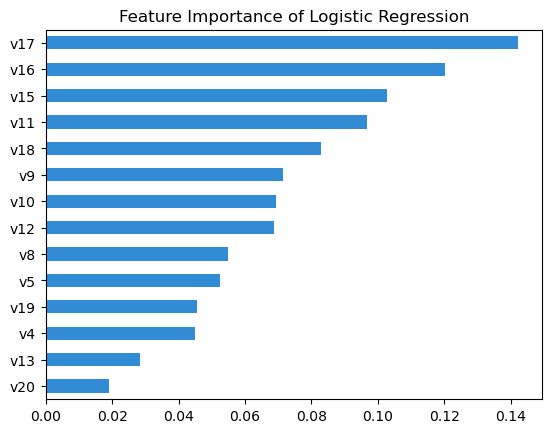

In [24]:
interpreter = Interpretation(
    x_test_scl, feature_names = x_train.columns
)

pyint_model = InMemoryModel(
    model.predict_proba,
    examples = x_train
)

plots= interpreter.feature_importance.plot_feature_importance(pyint_model, ascending = False, progressbar = True)
plt.title('Feature Importance of Logistic Regression')

In [25]:
fpr, tpr, _ = roc_curve(
    y_test, 
    model.predict_proba(x_test)[:, 1]
)

roc_auc = auc(fpr, tpr)

trace1 = go.Scatter(
    x = fpr, y = tpr, 
    mode = 'lines', 
    line = dict(width = 2),
    # name = 'Logistic Regression (AUC = {:0.2f})'.format(roc_auc)
)

trace2 = go.Scatter(
        x = [0, 1], y = [0, 1],
        mode = 'lines',
        line = dict(color = 'navy', width = 2, dash = 'dash'),
        showlegend = False
)

layout = go.Layout(
        title = {
            'text': 'ROC Curves (AUC = {:0.2f})'.format(roc_auc),
            'font': {
                'size': 40, 'family': 'Gulliver'
            }, 
            'x': 0.5, 'y': 0.95
        },
        xaxis = dict(
            title = {
                'text': 'False Positive Rate',
                'font': {
                    'size': 24, 'family': 'Gulliver'
                }
            }
        ),
        yaxis = dict(
            title = {
                'text': 'True Positive Rate',
                'font': {
                    'size': 24, 'family': 'Gulliver'
                }
            }
        ),
        width = 1200, height = 800,
        showlegend = False
)

fig = go.Figure(
    data = [trace1, trace2], 
    layout = layout
)

fig.show()

/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names



## Stepwise Selection

In [7]:
X = train.drop(['cls'], axis = 1)
y = train.cls

# scl = StandardScaler()
# X_scl = scl.fit_transform(X)

sfs = SFS(
    cv = 5, 
    estimator = LogisticRegression(max_iter = int(1e7), C = 1, penalty = 'l2', solver = 'lbfgs', n_jobs = -1, random_state = 42),
    forward = True,
    floating = True,
    k_features = 30, 
    scoring = 'accuracy',
    n_jobs = -1
) 

sfs.fit(X, y)

print(sfs.feature_names)
print(sfs.feature_names_to_idx_mapper)
print(sfs.k_score_)

['v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v9', 'v10', 'v11', 'v12', 'v13', 'v14', 'v15', 'v16', 'v17', 'v18', 'v19', 'v20', 'v21', 'alea1', 'alea2', 'alea3', 'alea4', 'alea5', 'alea6', 'alea7', 'alea8', 'alea9', 'alea10', 'alea11', 'alea12', 'alea13', 'alea14', 'alea15', 'alea16', 'alea17', 'alea18', 'alea19', 'alea20', 'alea21', 'alea22', 'alea23', 'alea24', 'alea25', 'alea26', 'alea27', 'alea28', 'alea29', 'alea30', 'alea31', 'alea32', 'alea33', 'alea34', 'alea35', 'alea36', 'alea37', 'alea38', 'alea39', 'alea40', 'alea41', 'alea42', 'alea43', 'alea44', 'alea45', 'alea46', 'alea47', 'alea48', 'alea49', 'alea50', 'alea51', 'alea52', 'alea53', 'alea54', 'alea55', 'alea56', 'alea57', 'alea58', 'alea59', 'alea60', 'alea61', 'alea62', 'alea63', 'alea64', 'alea65', 'alea66', 'alea67', 'alea68', 'alea69', 'alea70', 'alea71', 'alea72', 'alea73', 'alea74', 'alea75', 'alea76', 'alea77', 'alea78', 'alea79', 'alea80', 'alea81', 'alea82', 'alea83', 'alea84', 'alea85', 'alea86', 'alea87', 

In [8]:
sfs.get_metric_dict()[30]

{'feature_idx': (3,
  7,
  8,
  9,
  10,
  11,
  12,
  14,
  15,
  16,
  17,
  22,
  27,
  29,
  38,
  44,
  46,
  49,
  52,
  55,
  62,
  68,
  71,
  78,
  91,
  101,
  105,
  115,
  118,
  120),
 'cv_scores': array([0.9205, 0.908 , 0.929 , 0.923 , 0.924 ]),
 'avg_score': 0.9209000000000002,
 'feature_names': ('v4',
  'v8',
  'v9',
  'v10',
  'v11',
  'v12',
  'v13',
  'v15',
  'v16',
  'v17',
  'v18',
  'alea2',
  'alea7',
  'alea9',
  'alea18',
  'alea24',
  'alea26',
  'alea29',
  'alea32',
  'alea35',
  'alea42',
  'alea48',
  'alea51',
  'alea58',
  'alea71',
  'alea81',
  'alea85',
  'alea95',
  'alea98',
  'alea100'),
 'ci_bound': 0.00901904307275505,
 'std_dev': 0.00701712191713954,
 'std_err': 0.0035085609585697695}

In [274]:
metric_dict = sfs.get_metric_dict()
k_features = list(metric_dict.keys())
avg_scores = np.array([metric_dict[k]['avg_score'] for k in k_features])
std_devs = np.array([metric_dict[k]['std_dev'] for k in k_features])

fig = go.Figure()
fig.add_trace(
    go.Scatter(
    x = k_features, y = avg_scores, 
    mode = 'lines+markers', name = 'Average Score'
    )
)

fig.update_layout(
    title = {
        'text': 'Stepwise Selection',
        'font': {
            'size': 40, 'family': 'Gulliver'
        }, 'x': 0.5
    }, 
    xaxis_title = {
        'text': 'Number of Features',
        'font': {
            'size': 24, 'family': 'Gulliver'
        }
    }, 
    yaxis_title = {
        'text': 'Performence (Accuracy)',
        'font': {
            'size': 24, 'family': 'Gulliver'
        }
    }, 
    width = 1200, height = 800
)

fig.show()

In [32]:
model = LogisticRegression(max_iter = int(1e7))

X = train[['v9', 'v10', 'v11', 'v12', 'v13', 'v15', 'v16', 'v17', 'v18']]
y = train.cls

scl = StandardScaler()
X_scl = scl.fit_transform(X)

params = {
    'C': [10**i for i in range(-4, 5)],
    'penalty': ['l2', 'elasticnet', 'None'],
    'solver': ['lbfgs', 'liblinear', 'saga']   
}

grid_search = GridSearchCV(model, param_grid = params, cv = kf)
grid_search.fit(X_scl, y)

print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

Best parameters: {'C': 1, 'penalty': 'l2', 'solver': 'lbfgs'}
Best score: 0.9152999999999999


/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning:


270 fits failed out of a total of 405.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
45 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
Va

### Stepwise selection model performance

In [33]:
x_train = train[['v9', 'v10', 'v11', 'v12', 'v13', 'v15', 'v16', 'v17', 'v18']]
y_train = train.cls

x_test = test[['v9', 'v10', 'v11', 'v12', 'v13', 'v15', 'v16', 'v17', 'v18']]
y_test = test.cls

scl = StandardScaler()
x_train_scl = scl.fit_transform(x_train)
x_test_scl = scl.transform(x_test)

clf = LogisticRegression(max_iter = int(1e7), C = 1, penalty = 'l2', solver = 'lbfgs', random_state = 42)
model = clf.fit(x_train_scl, y_train)
y_pred = model.predict(x_test_scl)

In [34]:
acu = metrics.accuracy_score(y_test, y_pred)
pre_class, r_class, f_class, sup = metrics.precision_recall_fscore_support(y_test, y_pred, average = 'weighted')

print("Acurracy: ", round(acu * 100, 4), '%')
print('Precision:', round(pre_class * 100, 4), '%')
print('Recall:', round(r_class * 100, 4), '%')
print('f1:', round(f_class * 100, 4), '%')

cm = metrics.confusion_matrix(y_test, y_pred)
cm = pd.DataFrame(cm)
cm

Acurracy:  91.9602 %
Precision: 91.9825 %
Recall: 91.9602 %
f1: 91.9599 %


,0,1
0,10692,1068
1,808,10766


[7/9] features ███████████████----- Time elapsed: 0 seconds

/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names



[9/9] features ████████████████████ Time elapsed: 0 seconds

Text(0.5, 1.0, 'Feature Importance of Logistic Regression')

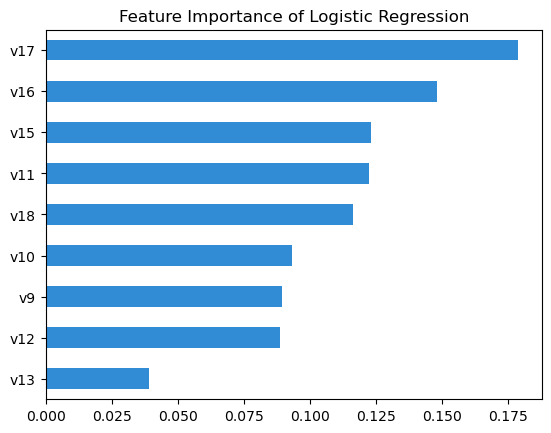

In [31]:
interpreter = Interpretation(
    x_test_scl, feature_names = x_train.columns
)

pyint_model = InMemoryModel(
    model.predict_proba,
    examples = x_train
)

plots= interpreter.feature_importance.plot_feature_importance(pyint_model, ascending = False, progressbar = True)
plt.title('Feature Importance of Logistic Regression')

In [259]:
fpr, tpr, _ = roc_curve(
    y_test, 
    model.predict_proba(x_test)[:, 1]
)

roc_auc = auc(fpr, tpr)

trace1 = go.Scatter(
    x = fpr, y = tpr, 
    mode = 'lines', 
    line = dict(width = 2),
    # name = 'Logistic Regression (AUC = {:0.2f})'.format(roc_auc)
)

trace2 = go.Scatter(
        x = [0, 1], y = [0, 1],
        mode = 'lines',
        line = dict(color = 'navy', width = 2, dash = 'dash'),
        showlegend = False
)

layout = go.Layout(
        title = {
            'text': 'ROC Curves (AUC = {:0.2f})'.format(roc_auc),
            'font': {
                'size': 40, 'family': 'Gulliver'
            }, 
            'x': 0.5, 'y': 0.95
        },
        xaxis = dict(
            title = {
                'text': 'False Positive Rate',
                'font': {
                    'size': 24, 'family': 'Gulliver'
                }
            }
        ),
        yaxis = dict(
            title = {
                'text': 'True Positive Rate',
                'font': {
                    'size': 24, 'family': 'Gulliver'
                }
            }
        ),
        width = 1200, height = 800,
        showlegend = False
)

fig = go.Figure(
    data = [trace1, trace2], 
    layout = layout
)

fig.show()

/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names



### All 'v' model performance

In [9]:
x_train = train[['v1','v2','v3','v4', 'v5','v6','v7','v8', 'v9', 'v10', 'v11', 'v12', 'v13','v14', 'v15', 'v16', 'v17', 'v18', 'v19','v20','v21',]]
y_train = train.cls

x_test = test[['v1','v2','v3','v4', 'v5','v6','v7','v8', 'v9', 'v10', 'v11', 'v12', 'v13','v14', 'v15', 'v16', 'v17', 'v18', 'v19','v20','v21',]]
y_test = test.cls

scl = StandardScaler()
x_train_scl = scl.fit_transform(x_train)
x_test_scl = scl.transform(x_test)

clf = LogisticRegression(max_iter = int(1e7), C = 0.01, penalty = 'l2', solver = 'lbfgs', random_state = 42)
model = clf.fit(x_train_scl, y_train)
y_pred = model.predict(x_test_scl)
acu = metrics.accuracy_score(y_test, y_pred)
pre_class, r_class, f_class, sup = metrics.precision_recall_fscore_support(y_test, y_pred, average = 'weighted')

print("Acurracy: ", round(acu * 100, 4), '%')
print('Precision:', round(pre_class * 100, 4), '%')
print('Recall:', round(r_class * 100, 4), '%')
print('f1:', round(f_class * 100, 4), '%')

cm = metrics.confusion_matrix(y_test, y_pred)
cm = pd.DataFrame(cm)
cm

Acurracy:  92.4316 %
Precision: 92.4656 %
Recall: 92.4316 %
f1: 92.431 %


,0,1
0,10716,1044
1,722,10852


[3/21] features ██------------------ Time elapsed: 0 seconds

/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names



[21/21] features ████████████████████ Time elapsed: 1 seconds

Text(0.5, 1.0, 'Feature Importance of Logistic Regression')

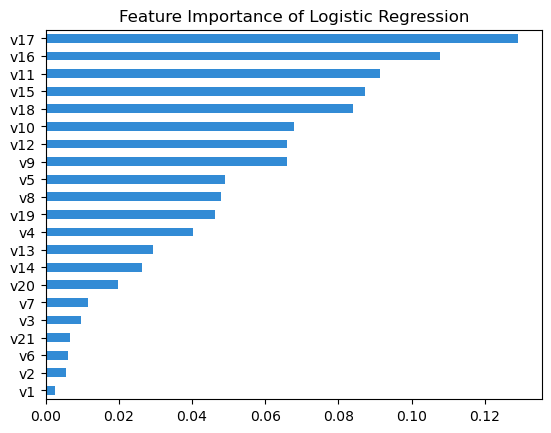

In [11]:
interpreter = Interpretation(
    x_test_scl, feature_names = x_train.columns
)

pyint_model = InMemoryModel(
    model.predict_proba,
    examples = x_train
)

plots= interpreter.feature_importance.plot_feature_importance(pyint_model, ascending = False, progressbar = True)
plt.title('Feature Importance of Logistic Regression')

In [12]:
fpr, tpr, _ = roc_curve(
    y_test, 
    model.predict_proba(x_test)[:, 1]
)

roc_auc = auc(fpr, tpr)

trace1 = go.Scatter(
    x = fpr, y = tpr, 
    mode = 'lines', 
    line = dict(width = 2),
    # name = 'Logistic Regression (AUC = {:0.2f})'.format(roc_auc)
)

trace2 = go.Scatter(
        x = [0, 1], y = [0, 1],
        mode = 'lines',
        line = dict(color = 'navy', width = 2, dash = 'dash'),
        showlegend = False
)

layout = go.Layout(
        title = {
            'text': 'ROC Curves (AUC = {:0.2f})'.format(roc_auc),
            'font': {
                'size': 40, 'family': 'Gulliver'
            }, 
            'x': 0.5, 'y': 0.95
        },
        xaxis = dict(
            title = {
                'text': 'False Positive Rate',
                'font': {
                    'size': 24, 'family': 'Gulliver'
                }
            }
        ),
        yaxis = dict(
            title = {
                'text': 'True Positive Rate',
                'font': {
                    'size': 24, 'family': 'Gulliver'
                }
            }
        ),
        width = 1200, height = 800,
        showlegend = False
)

fig = go.Figure(
    data = [trace1, trace2], 
    layout = layout
)

fig.show()

/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names



### All 'a' model performance

In [14]:
x_train = train.drop(['v1','v2','v3','v4', 'v5','v6','v7','v8', 'v9', 'v10', 'v11', 'v12', 'v13','v14', 'v15', 'v16', 'v17', 'v18', 'v19','v20','v21', 'cls'], axis = 1)
y_train = train.cls

x_test = test.drop(['v1','v2','v3','v4', 'v5','v6','v7','v8', 'v9', 'v10', 'v11', 'v12', 'v13','v14', 'v15', 'v16', 'v17', 'v18', 'v19','v20','v21','cls'], axis = 1)
y_test = test.cls

scl = StandardScaler()
x_train_scl = scl.fit_transform(x_train)
x_test_scl = scl.transform(x_test)

clf = LogisticRegression(max_iter = int(1e7), C = 0.01, penalty = 'l2', solver = 'lbfgs', random_state = 42)
model = clf.fit(x_train_scl, y_train)
y_pred = model.predict(x_test_scl)
acu = metrics.accuracy_score(y_test, y_pred)
pre_class, r_class, f_class, sup = metrics.precision_recall_fscore_support(y_test, y_pred, average = 'weighted')

print("Acurracy: ", round(acu * 100, 4), '%')
print('Precision:', round(pre_class * 100, 4), '%')
print('Recall:', round(r_class * 100, 4), '%')
print('f1:', round(f_class * 100, 4), '%')

cm = metrics.confusion_matrix(y_test, y_pred)
cm = pd.DataFrame(cm)
cm

Acurracy:  50.3471 %
Precision: 50.3467 %
Recall: 50.3471 %
f1: 50.3469 %


,0,1
0,5973,5787
1,5799,5775


[1/100] features -------------------- Time elapsed: 0 seconds

/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names



[100/100] features ████████████████████ Time elapsed: 20 seconds

Text(0.5, 1.0, 'Feature Importance of Logistic Regression')

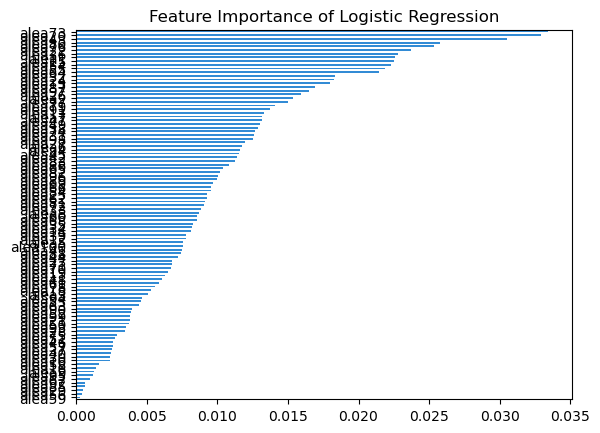

In [15]:
interpreter = Interpretation(
    x_test_scl, feature_names = x_train.columns
)

pyint_model = InMemoryModel(
    model.predict_proba,
    examples = x_train
)

plots= interpreter.feature_importance.plot_feature_importance(pyint_model, ascending = False, progressbar = True)
plt.title('Feature Importance of Logistic Regression')

In [16]:
fpr, tpr, _ = roc_curve(
    y_test, 
    model.predict_proba(x_test)[:, 1]
)

roc_auc = auc(fpr, tpr)

trace1 = go.Scatter(
    x = fpr, y = tpr, 
    mode = 'lines', 
    line = dict(width = 2),
    # name = 'Logistic Regression (AUC = {:0.2f})'.format(roc_auc)
)

trace2 = go.Scatter(
        x = [0, 1], y = [0, 1],
        mode = 'lines',
        line = dict(color = 'navy', width = 2, dash = 'dash'),
        showlegend = False
)

layout = go.Layout(
        title = {
            'text': 'ROC Curves (AUC = {:0.2f})'.format(roc_auc),
            'font': {
                'size': 40, 'family': 'Gulliver'
            }, 
            'x': 0.5, 'y': 0.95
        },
        xaxis = dict(
            title = {
                'text': 'False Positive Rate',
                'font': {
                    'size': 24, 'family': 'Gulliver'
                }
            }
        ),
        yaxis = dict(
            title = {
                'text': 'True Positive Rate',
                'font': {
                    'size': 24, 'family': 'Gulliver'
                }
            }
        ),
        width = 1200, height = 800,
        showlegend = False
)

fig = go.Figure(
    data = [trace1, trace2], 
    layout = layout
)

fig.show()

/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:432: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names



### Model complexity

In [10]:
C_range = [ 10**i for i in range(-4, 5) ]

train_errors = []
test_errors = []

for C in C_range:
    clf = LogisticRegression(
        max_iter = int(1e7), C = C, penalty = 'l2', solver = 'lbfgs', random_state = 42
    )
    clf.fit(x_train_scl, y_train)
    train_errors.append(1 - clf.score(x_train_scl, y_train))
    test_errors.append(1 - clf.score(x_test_scl, y_test))

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x = [ np.log10(C) for C in C_range ], y = train_errors,
        mode = 'lines+markers',
        name = 'Train Error'
    )
)

fig.add_trace(
    go.Scatter(
        x = [ np.log10(C) for C in C_range ], y = test_errors,
        mode = 'lines+markers',
        name = 'Test Error'
    )
)
fig.update_layout(
    title = {
        'text': 'Model Complexity (Lasso)',
        'font': {
            'size': 40, 'family': 'Gulliver'
        },
        'x': 0.5
    },
    width = 800, height = 600,
    xaxis_title = {
        'text': 'Log(C)',
        'font': {
            'size': 24, 'family': 'Gulliver'
        }
    },
    yaxis_title = {
        'text': 'Classification Error',
        'font': {
            'size': 24, 'family': 'Gulliver'
        }
    }
)

fig.update_yaxes(
    range = [0.075, 0.095]
)

fig.show()